# Yuan et al (CS9) only analysis with fused annotations


In [1]:

import warnings
import scanpy as sc
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.sparse as sp

warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 0
sns.set(rc={"figure.figsize": (4, 3.5), "figure.dpi": 100})
sns.set_style("whitegrid")

sc.settings.set_figure_params(
    dpi=200,
    dpi_save=200,
    frameon=False
)

import os
wdir = "/mnt/nfs/CX000008_DS1/projects/gaurav/mistr/published_dataset_analyis/yuan_et_al/"
os.chdir(wdir)


## Load Yuan CS9 data


In [2]:

yuan = sc.read_h5ad('yuan_cs9.h5ad')
print(yuan)
print("obs cols (first 12):", list(yuan.obs.columns)[:12])
print("layers:", list(yuan.layers.keys())[:10])


AnnData object with n_obs × n_vars = 45512 × 29627
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample_num', 'spatial_x', 'spatial_y', 'celltype', 'ident'
    uns: 'X_name'
    layers: 'logcounts'
obs cols (first 12): ['orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample_num', 'spatial_x', 'spatial_y', 'celltype', 'ident']
layers: ['logcounts']


## Build fused annotations (MHB-focused)


In [3]:

# keep fine labels for MHB
keep_neural_fine = {"FBP", "MBP", "HBP"}

map_coarse_non_neural = {
    # mesoderm
    "Par.Meso": "Mesoderm", "Pha.Meso": "Mesoderm", "Hea.Meso": "Mesoderm",
    "Int.Meso": "Mesoderm", "Car.Meso": "Mesoderm", "Somite": "Mesoderm",
    "Stalk": "Mesoderm", "aPSM": "Mesoderm", "pPSM": "Mesoderm",
    "Som.LPM": "Mesoderm", "Spl.LPM": "Mesoderm", "mLPM": "Mesoderm",
    # endoderm
    "FG.Endo": "Endoderm", "HG.Endo": "Endoderm", "MG.Endo": "Endoderm",
    # notochord
    "Noto": "Notochord",
    # ectoderm (non-neural)
    "Sur.Ecto": "Surface_ectoderm",
    # extraembryonic
    "AM": "Extraembryonic",
    # other
    "SC-1": "Other", "SC-2": "Other", "AT": "Other", "MC": "Other",
    "ECT": "Other", "NMP": "Other",
}

yuan_label_key = "celltype" if "celltype" in yuan.obs.columns else "ident"
if yuan_label_key not in yuan.obs.columns:
    raise ValueError("Yuan reference must contain obs['celltype'] or obs['ident'].")

yuan.obs["celltype_mhb3"] = yuan.obs[yuan_label_key].astype(str)
mask_non_neural = ~yuan.obs["celltype_mhb3"].isin(keep_neural_fine)
yuan.obs.loc[mask_non_neural, "celltype_mhb3"] = (
    yuan.obs.loc[mask_non_neural, yuan_label_key]
        .astype(str)
        .map(map_coarse_non_neural)
        .fillna("Other")
        .values
)

order = ["FBP","MBP","HBP","Mesoderm","Endoderm","Notochord",
         "Surface_ectoderm","Extraembryonic","Other"]
yuan.obs["celltype_mhb3"] = pd.Categorical(yuan.obs["celltype_mhb3"], categories=order, ordered=True)
print("Collapsed Yuan labels:\n", yuan.obs["celltype_mhb3"].value_counts())



Collapsed Yuan labels:
 celltype_mhb3
Mesoderm            18454
Other                8539
Extraembryonic       7720
Endoderm             5183
Surface_ectoderm     1688
MBP                  1488
FBP                  1123
Notochord             663
HBP                   654
Name: count, dtype: int64


## Preprocessing + HVGs + PCA/UMAP


In [4]:

# Ensure counts
if "counts" not in yuan.layers:
    yuan.layers["counts"] = yuan.X.copy()

# Normalize + log1p
# Put raw counts into X for preprocessing
yuan.X = yuan.layers["counts"]
sc.pp.normalize_total(yuan, target_sum=1e4)
sc.pp.log1p(yuan)

# Store log1p layer
yuan.layers["log1p_norm"] = yuan.X.copy()

# HVGs
batch_key = "sample_num" if "sample_num" in yuan.obs.columns else None
sc.pp.highly_variable_genes(
    yuan,
    flavor="seurat_v3",
    n_top_genes=3000,
    layer="counts",
    subset = False
    #batch_key=batch_key
)

print("HVGs:", int(yuan.var["highly_variable"].sum()))

# PCA + UMAP
# yuan_hvg = yuan[:, yuan.var["highly_variable"]].copy()
sc.pp.scale(yuan, max_value=10)
sc.tl.pca(yuan, n_comps=50, svd_solver="arpack")

sc.pp.neighbors(yuan, use_rep="X_pca", n_neighbors=30)
sc.tl.umap(yuan, random_state=0)
print("PCA done:", yuan.obsm["X_pca"].shape)

HVGs: 3000


/home/grathore/conda_envs/gaurav_python_r/lib/python3.10/functools.py:889: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


PCA done: (45512, 50)


## UMAP: fused annotations and marker genes


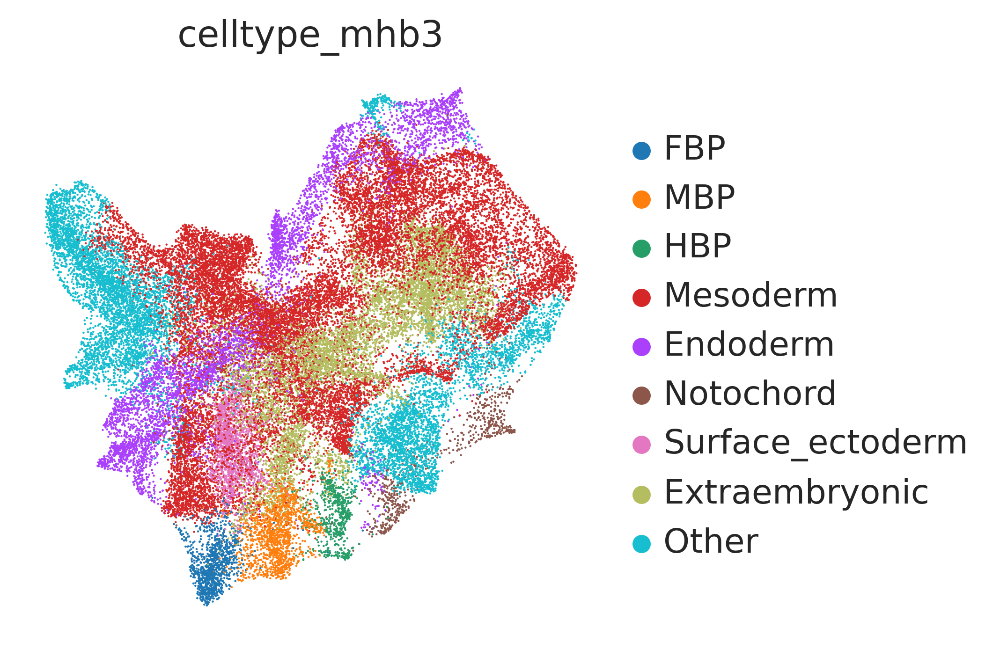

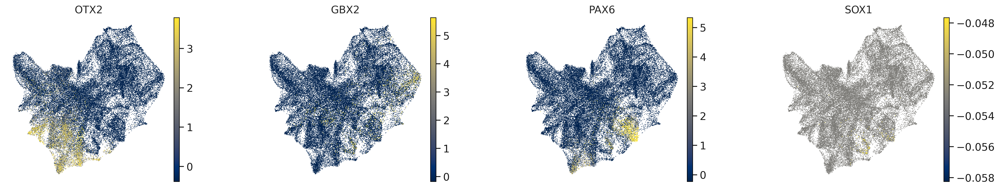

In [5]:

# UMAP with fused annotations
sc.pl.umap(yuan, color=["celltype_mhb3"], wspace=0.4)

# Marker genes on new UMAP
genes = [g for g in ["OTX2", "GBX2", "PAX6", "SOX1"] if g in yuan.var_names]
if len(genes) > 0:
    sc.pl.umap(yuan, color=genes, cmap='cividis', vmax='p99', wspace=0.4)
else:
    print("None of OTX2/GBX2/PAX6/SOX1 found in var_names.")


## keep neural 

In [6]:
# Subset Yuan to only the fine neural labels
keep_neural_fine = {"FBP", "MBP", "HBP"}

yuan_neural = yuan[yuan.obs["celltype_mhb3"].isin(keep_neural_fine)].copy()

# Optional: keep category order restricted to these three
yuan_neural.obs["celltype_mhb3"] = pd.Categorical(
    yuan_neural.obs["celltype_mhb3"],
    categories=["FBP", "MBP", "HBP"],
    ordered=True
)

print(yuan_neural)
print(yuan_neural.obs["celltype_mhb3"].value_counts())


AnnData object with n_obs × n_vars = 3265 × 29627
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample_num', 'spatial_x', 'spatial_y', 'celltype', 'ident', 'celltype_mhb3'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'X_name', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'celltype_mhb3_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'logcounts', 'counts', 'log1p_norm'
    obsp: 'distances', 'connectivities'
celltype_mhb3
MBP    1488
FBP    1123
HBP     654
Name: count, dtype: int64


/home/grathore/conda_envs/gaurav_python_r/lib/python3.10/site-packages/legacy_api_wrap/__init__.py:88: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  return fn(*args_all, **kw)
/home/grathore/conda_envs/gaurav_python_r/lib/python3.10/functools.py:889: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


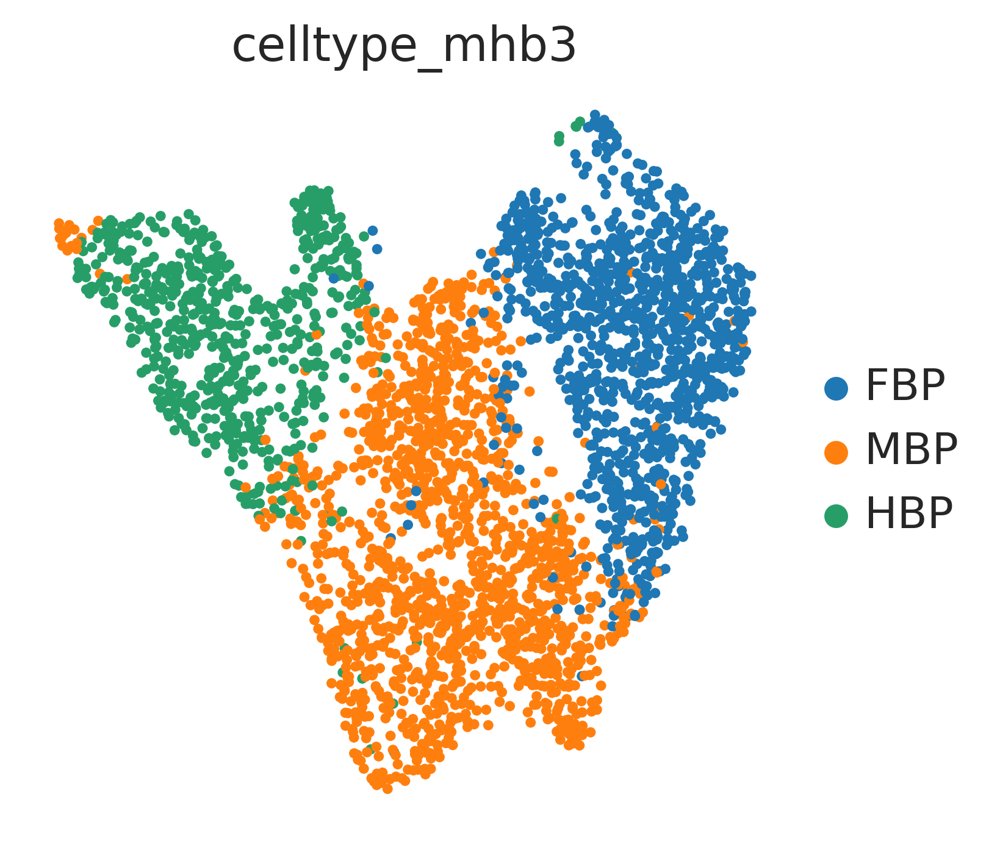

In [7]:
# 1) Move counts layer into .X
if "counts" not in yuan_neural.layers:
    raise ValueError("yuan_neural.layers['counts'] not found.")
yuan_neural.X = yuan_neural.layers["counts"].copy()

# 2) Normalize + log transform
sc.pp.normalize_total(yuan_neural, target_sum=1e4)
sc.pp.log1p(yuan_neural)

# 3) Compute UMAP
sc.pp.highly_variable_genes(yuan_neural, n_top_genes=3000, flavor="seurat_v3")
yuan_neural_hvg = yuan_neural[:, yuan_neural.var["highly_variable"]].copy()

sc.pp.scale(yuan_neural_hvg, max_value=10)
sc.tl.pca(yuan_neural_hvg, svd_solver="arpack")
sc.pp.neighbors(yuan_neural_hvg, n_neighbors=15, n_pcs=30)
sc.tl.umap(yuan_neural_hvg)

# 4) Plot UMAP
sc.pl.umap(yuan_neural_hvg, color=["celltype_mhb3"], frameon=False)


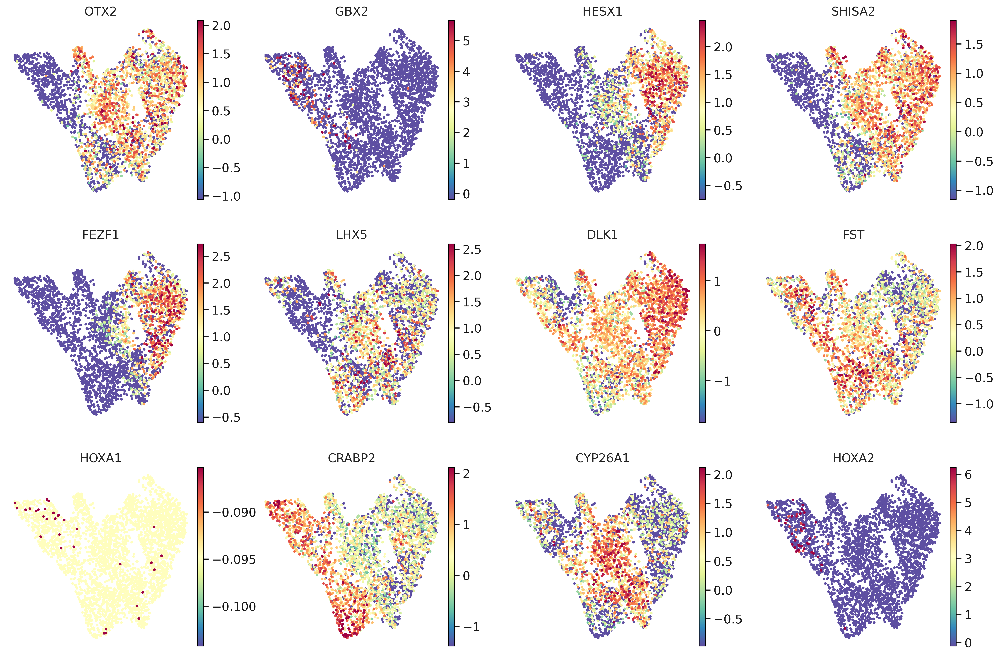

In [8]:
sc.pl.umap(yuan_neural_hvg, color=['OTX2','GBX2','HESX1','SHISA2','FEZF1','LHX5','DLK1','FST','HOXA1','CRABP2','CYP26A1','HOXA2'],cmap ='Spectral_r',vmax = 'p99' ,frameon=False)

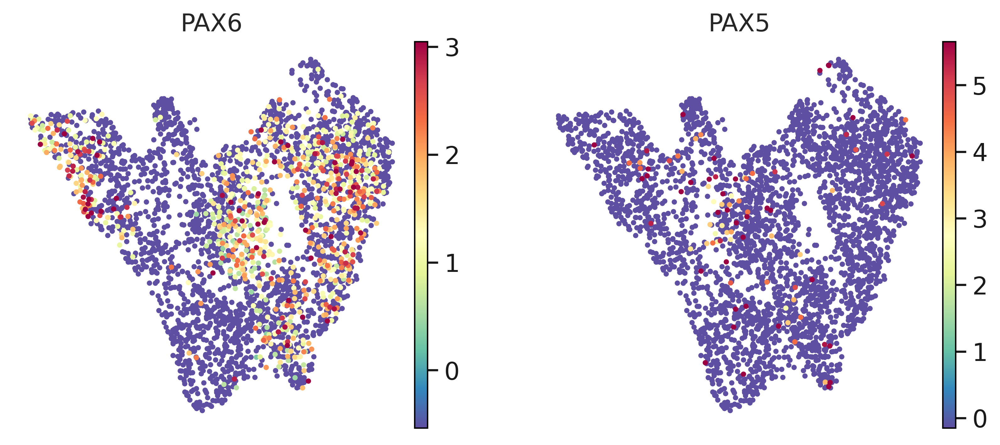

In [11]:
sc.pl.umap(yuan_neural_hvg, color=['PAX6','PAX5'],cmap ='Spectral_r',vmax = 'p99' ,frameon=False)